##  The CIFAR-10 dataset consists of 60000 32x32 colour images in 10 classes, with 6000 images per class. There are 50000 training images and 10000 test images

For more details see https://www.cs.toronto.edu/~kriz/cifar.html

In [1]:
# Import Library
from keras.datasets import cifar10
from matplotlib import pyplot

# load data
(X_train, y_train), (X_test, y_test) = cifar10.load_data()



Using TensorFlow backend.


170500096/170498071 [==============================] - 6s 0us/step


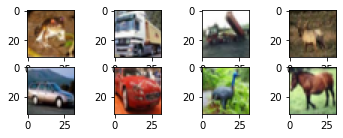

In [7]:
# create a grid of 3x3 images
for i in range(0, 8):
	pyplot.subplot(440 + 1 + i)
	pyplot.imshow(X_train[i])
# show the plot
pyplot.show()

In [8]:
# Simple CNN model for CIFAR-10
from keras.datasets import cifar10
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import Flatten
from keras.constraints import maxnorm
from keras.optimizers import adam
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D
from keras.utils import np_utils

In [9]:
# load dataset
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
# normalize inputs range
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')
X_train = X_train / 255.0
X_test = X_test / 255.0

In [10]:
# one hot encoding on outpts
y_train = np_utils.to_categorical(y_train)
y_test = np_utils.to_categorical(y_test)
num_classes = y_test.shape[1]

In [11]:
# Define model architecture
model = Sequential()
model.add(Conv2D(32, (3, 3), input_shape=(32, 32, 3), padding='same', activation='relu', kernel_constraint=maxnorm(3)))
model.add(Dropout(0.2))
model.add(Conv2D(32, (3, 3), activation='relu', padding='same', kernel_constraint=maxnorm(3)))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(512, activation='relu', kernel_constraint=maxnorm(3)))
model.add(Dropout(0.4))
model.add(Dense(num_classes, activation='softmax'))
# Compile model
epochs = 20
lrate = 0.01
decay = lrate/epochs
# sgd = SGD(lr=lrate, momentum=0.9, decay=decay, nesterov=False) 
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 32, 32, 32)        896       
_________________________________________________________________
dropout_1 (Dropout)          (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 32)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 8192)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               4194816   
_________________________________________________________________
dropout_2 (Dropout)          (None, 512)              

In [12]:
# Fit the model
model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=epochs, batch_size=64)

# Final evaluation of the model
scores = model.evaluate(X_test, y_test, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

Train on 50000 samples, validate on 10000 samples
Epoch 1/20
50000/50000 [==============================] - 13s 258us/step - loss: 1.5006 - accuracy: 0.4589 - val_loss: 1.1528 - val_accuracy: 0.5914
Epoch 2/20
50000/50000 [==============================] - 6s 127us/step - loss: 1.1239 - accuracy: 0.6017 - val_loss: 1.0137 - val_accuracy: 0.6476
Epoch 3/20
50000/50000 [==============================] - 6s 127us/step - loss: 0.9956 - accuracy: 0.6486 - val_loss: 0.9634 - val_accuracy: 0.6703
Epoch 4/20
50000/50000 [==============================] - 6s 126us/step - loss: 0.9176 - accuracy: 0.6753 - val_loss: 0.9245 - val_accuracy: 0.6797
Epoch 5/20
50000/50000 [==============================] - 6s 127us/step - loss: 0.8552 - accuracy: 0.6993 - val_loss: 0.9045 - val_accuracy: 0.6844
Epoch 6/20
50000/50000 [==============================] - 6s 127us/step - loss: 0.8084 - accuracy: 0.7151 - val_loss: 0.8654 - val_accuracy: 0.7035
Epoch 7/20
50000/50000 [==============================] - 6s 

Normally the CNN models are trained on atleast three digit epochs and are time consuming. You can try changing the parameters and tuning them to obtain better performing mode

## Visualizing the feature maps in a CNN
 
 -> Feature maos are output of any CNN layer. It can help us understand what features our CNN model looks for in the image

In [13]:
from keras.applications.vgg16 import VGG16

# Load up our model
model = VGG16()

# Model summary 
model.summary()

553467904/553467096 [==============================] - 17s 0us/step
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
___________________________________________________________

In [14]:
from keras.applications.vgg16 import VGG16
import matplotlib.pyplot as plt
import numpy as np

model = VGG16()


In [15]:
layer_dict = dict([(layer.name, layer) for layer in model.layers])

layer_name = 'block5_conv1'
filter_index = 0 # Which filter in this block would you like to visualise?


In [16]:
# Grab the filters and biases for that layer
filters, biases = layer_dict[layer_name].get_weights()

# Normalize filter values to a range of 0 to 1 so we can visualize them
f_min, f_max = np.amin(filters), np.amax(filters)
filters = (filters - f_min) / (f_max - f_min)


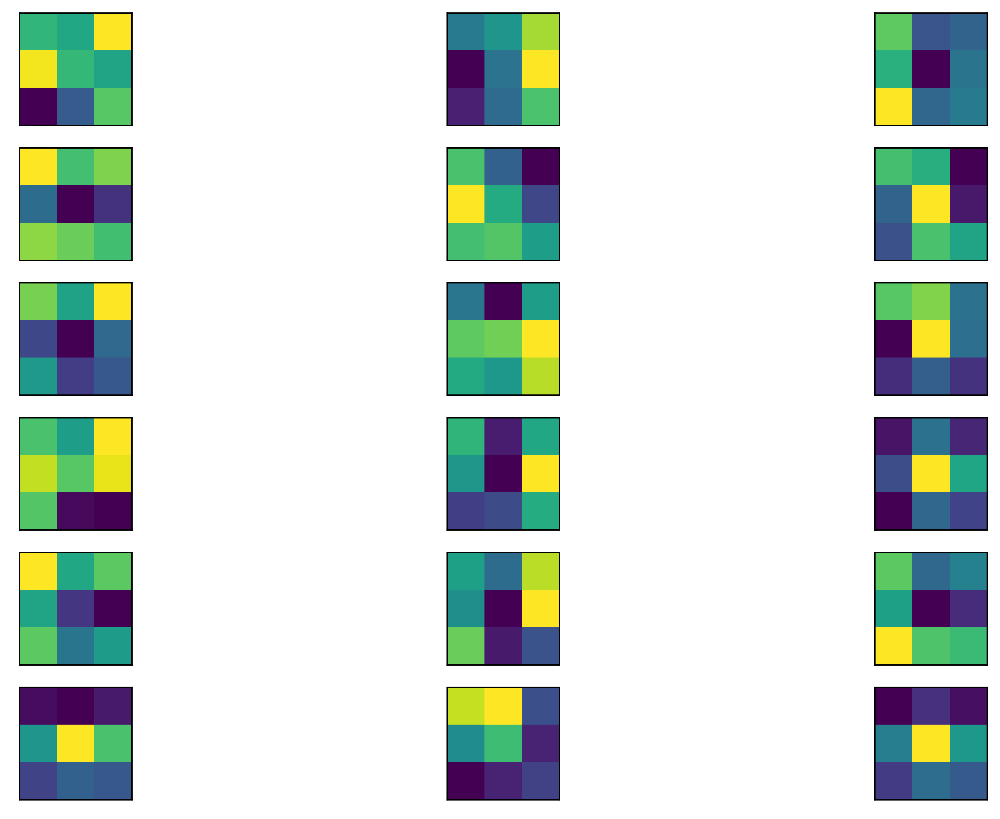

In [17]:
# Plot first few filters
from matplotlib.pyplot import figure
figure(num=None, figsize=(12, 8), dpi=600, edgecolor='k')
n_filters, index = 6, 1
for i in range(n_filters):
    f = filters[:, :, :, i]
     # Plot each channel separately
    for j in range(3):

        ax = plt.subplot(n_filters, 3, index)
        ax.set_xticks([])
        ax.set_yticks([])
        
        plt.imshow(f[:, :, j], cmap='viridis')
        index += 1
        
plt.show()  

In [18]:
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.preprocessing.image import load_img,img_to_array
from keras.models import Model
import matplotlib.pyplot as plt
import numpy as np

model = VGG16()

layer_dict = dict([(layer.name, layer) for layer in model.layers])

layer_name = 'block1_conv2'

model = Model(inputs=model.inputs, outputs=layer_dict[layer_name].output)


In [24]:
# Perpare the image
picture='car.jpg'
image = load_img(picture, target_size=(224, 224))
image = img_to_array(image)
image = np.expand_dims(image, axis=0)
image = preprocess_input(image)


In [25]:
# Apply feature maps to image
feature_maps = model.predict(image)


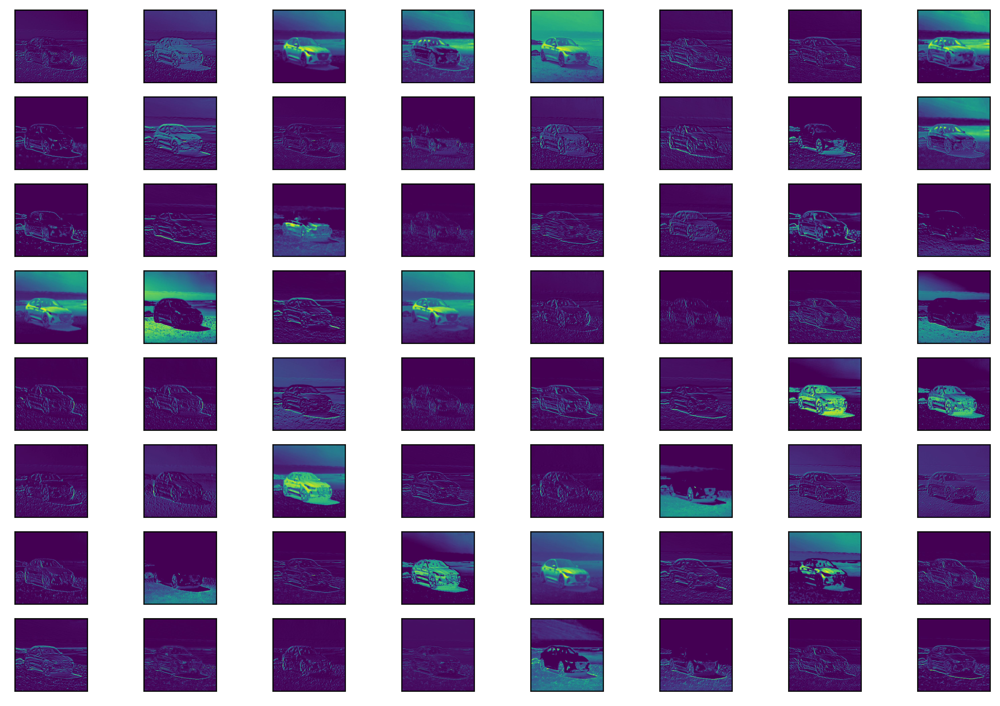

In [21]:
square = 8
index = 1
from matplotlib.pyplot import figure  
figure(num=None, figsize=(13, 9), dpi=600, edgecolor='k')  # Changing Image quality
for _ in range(square):
	for _ in range(square):
        
		ax = plt.subplot(square, square, index)
		ax.set_xticks([])
		ax.set_yticks([])
        
		plt.imshow(feature_maps[0, :, :, index-1], cmap='viridis')
		index += 1     
plt.show()